# Trade Strategy 1 with Machine Learning


## Outline:
* Set parameters of interest & Import Data

* Establish Trading Strategy with signals

* Identify Training & Testing dataset, Scale data if necessary

* Run model 1: Support Vector Classifier

    * Evaluate Performance
    * Backtest

* Run model 2: Random Forest Classififier

    * Evaluate Performance
    * Backtest
    
* Run model 2: k Nearest Neighbor Classifier

    * Evaluate Performance
    * Backtest

In [2]:
# Imports
import pandas as pd
import numpy as np
from pathlib import Path

import hvplot
import hvplot.pandas
import matplotlib.pyplot as plt
import talib as ta
from datetime import datetime
from sklearn import svm
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from pandas.tseries.offsets import DateOffset
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import mean_squared_error, r2_score
import math

### Set Parameters & Import the OHLCV dataset into a Pandas DataFrame.

In [3]:
# choose coin of interest: BTC,ETH,XRP,DOGE,ADA
# choose pair of interest: USD, USDT
coin = 'BTC'
pair = 'USD'

# choose exchange of interest Bitfinex, Binance, Coinbase
exchange = 'Bitfinex'

# choose data interval of interest 1h, 1d
time = '1h'

# get saved histoical csv data from Data folder, which was downloaded from cryptoDataOnline.com
df = pd.read_csv(Path(f"./Data/Formatted_Data/{exchange}/{pair}/{exchange}_{coin}_{time}.csv"), index_col= "Datetime", parse_dates= True, infer_datetime_format = True)
display (df.head())

,Exchange,Symbol_Pair,Open,High,Low,Close,Volume_USD,Volume_in_BTC
Datetime,,,,,,,,
2023-01-12 23:00:00,Bitfinex,BTC/USD,18913.0,18916.0,18856.0,18856.0,2.015120e+06,106.868894
2023-01-12 22:00:00,Bitfinex,BTC/USD,18834.0,18934.0,18785.0,18917.0,1.909037e+06,100.916485
2023-01-12 21:00:00,Bitfinex,BTC/USD,19064.0,19112.0,18775.0,18835.0,5.595288e+06,297.068657
2023-01-12 20:00:00,Bitfinex,BTC/USD,18889.0,19089.0,18828.0,19065.0,1.969036e+06,103.280162
2023-01-12 19:00:00,Bitfinex,BTC/USD,18803.0,19046.0,18771.0,18887.0,5.353192e+06,283.432631


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 40881 entries, 2023-01-12 23:00:00 to 2018-05-15 06:00:00
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Exchange       40881 non-null  object 
 1   Symbol_Pair    40881 non-null  object 
 2   Open           40881 non-null  float64
 3   High           40881 non-null  float64
 4   Low            40881 non-null  float64
 5   Close          40881 non-null  float64
 6   Volume_USD     40881 non-null  float64
 7   Volume_in_BTC  40881 non-null  float64
dtypes: float64(6), object(2)
memory usage: 2.8+ MB


In [5]:
dataframe = df.drop(columns=['Exchange','Symbol_Pair','Volume_in_BTC']).copy()
dataframe = dataframe.rename(columns={'Volume_USD': 'Volume'})
dataframe = dataframe.sort_index(ascending=True)

print(f"The timeframe contained in this dataset is: {dataframe.index.min()} to {dataframe.index.max()}")

The timeframe contained in this dataset is: 2018-05-15 06:00:00 to 2023-01-12 23:00:00


## Choose timeframe to be tested with the strategy in the models

In [6]:
# chose start and end times of data to analze
start = '2019-01-01 00:00:00'
end = '2023-01-12 00:00:00'
dataframe = dataframe.loc[start:end ,:]

print(f"Timeframe to be evaluated in strategy and model: {start} to {end}")

Timeframe to be evaluated in strategy and model: 2019-01-01 00:00:00 to 2023-01-12 00:00:00


## Define trading strategy with entry and exit signals

In [7]:
#Strategy 1
# calculations done with pandas-ta library

fast_period = 5
slow_period = 50
dataframe['fast_MA'] = ta.SMA(dataframe['Close'], timeperiod=fast_period)
dataframe['slow_MA'] = ta.SMA(dataframe['Close'], timeperiod=slow_period)
        

dataframe = dataframe.dropna()
dataframe.head()

,Open,High,Low,Close,Volume,fast_MA,slow_MA
Datetime,,,,,,,
2019-01-03 01:00:00,4016.4,4026.3,3999.1,4023.9,2498162.04,4035.49,3916.1878
2019-01-03 02:00:00,4023.9,4031.0,4012.2,4020.0,729858.55,4031.45,3919.8846
2019-01-03 03:00:00,4020.0,4025.0,4019.9,4024.9,360726.72,4026.80,3923.7996
2019-01-03 04:00:00,4024.9,4028.0,4014.3,4014.4,685145.90,4019.92,3927.7396
2019-01-03 05:00:00,4014.4,4014.5,3981.0,3996.1,1991951.25,4015.86,3931.0936


In [8]:
#plot
data = dataframe.hvplot(x='Datetime', y=['Close','fast_MA', 'slow_MA'], value_label = 'USD',title ="BTC/USD Close and SMA values")
data

:NdOverlay   [Variable]
   :Curve   [Datetime]   (USD)

In [9]:
#Entry and Exit Signals
signals_df = dataframe.loc[:,['Close','fast_MA', 'slow_MA']].copy()

signals_df['Signal'] = 0

for index, row in signals_df.iterrows():
    if (row['fast_MA'] > row['slow_MA']):
        signals_df.loc[index,'Signal'] = 1      
    if (row['fast_MA'] < row['slow_MA']):
        signals_df.loc[index,'Signal'] = 0      
    
signals_df["Entry/Exit"] = signals_df["Signal"].diff() #when uptrend changes to downtrend and vice versa (@crossover) indicates entry exit

In [10]:
signals_df['Signal'].value_counts()

1    18500
0    16771
Name: Signal, dtype: int64

In [11]:
# Calculate the strategy returns and add them to the DataFrame
signals_df['Actual Returns'] = signals_df['Close'].pct_change()
signals_df['Strategy Returns'] = signals_df['Actual Returns'] * signals_df['Signal'].shift()
signals_df = signals_df.dropna()

In [12]:
signals_df.head()

,Close,fast_MA,slow_MA,Signal,Entry/Exit,Actual Returns,Strategy Returns
Datetime,,,,,,,
2019-01-03 02:00:00,4020.0,4031.45,3919.8846,1,0.0,-0.000969,-0.000969
2019-01-03 03:00:00,4024.9,4026.80,3923.7996,1,0.0,0.001219,0.001219
2019-01-03 04:00:00,4014.4,4019.92,3927.7396,1,0.0,-0.002609,-0.002609
2019-01-03 05:00:00,3996.1,4015.86,3931.0936,1,0.0,-0.004559,-0.004559
2019-01-03 06:00:00,3996.0,4010.28,3934.5136,1,0.0,-0.000025,-0.000025


In [13]:
# Plot Strategy Returns to examine performance
strat = (1 + signals_df['Strategy Returns']).cumprod().hvplot(title="Strategy Returns- Exponential Moving Average", ylabel='Returns')
act = (1 + signals_df['Actual Returns']).cumprod().hvplot()
dual = strat * act
dual

:Overlay
   .Curve.Strategy_Returns :Curve   [Datetime]   (Strategy Returns)
   .Curve.Actual_Returns   :Curve   [Datetime]   (Actual Returns)

In [14]:
# Sum of the cumulative product of the Actual Returns
(1 + signals_df['Actual Returns']).cumprod().sum()

205918.48335284402

In [15]:
# Sum of the cumulative product of the Actual Returns
(1 + signals_df['Strategy Returns']).cumprod().sum()

137952.62996627053

In [16]:
#Plot
# Visualize exit position relative to close price
sell = signals_df[signals_df['Entry/Exit'] == -1.0]['Close'].hvplot.scatter(
    color='red',
    legend=False,
    ylabel='Price in $',
    width=1000,
    height=400)


# Visualize entry position relative to close price
buy = signals_df[signals_df['Entry/Exit'] == 1.0]['Close'].hvplot.scatter(
    color='blue',
    legend=False,
    ylabel='Price in $',
    width=1000,
    height=400)


# Visualize close price for the investment
close = signals_df[['Close']].hvplot(
    line_color='lightgray',
    ylabel='Price in $',
    width=1000,
    height=400)


# Visualize moving averages
moving_avgs = signals_df[['fast_MA', 'slow_MA']].hvplot(
    ylabel='Price in $',
    width=1000,
    height=400)

# Show the plot
entry_exit_plot = moving_avgs * close * buy * sell

entry_exit_plot

:Overlay
   .NdOverlay.I      :NdOverlay   [Variable]
      :Curve   [Datetime]   (value)
   .Curve.I          :Curve   [Datetime]   (Close)
   .Scatter.Close.I  :Scatter   [Datetime]   (Close)
   .Scatter.Close.II :Scatter   [Datetime]   (Close)

## Define training and testing datasets

In [17]:
# dataframe = dataframe.sort_values(by=["Datetime"], ascending=True)

In [18]:
# Assign a copy of the sma_fast and sma_slow columns to a features DataFrame called X
X = signals_df.drop(['Signal'], axis=1).shift().dropna().copy()
# Create the target set selecting the Signal column and assiging it to y
y = signals_df['Signal'].dropna().copy()

In [19]:
display(X.head())
display(y.head())

,Close,fast_MA,slow_MA,Entry/Exit,Actual Returns,Strategy Returns
Datetime,,,,,,
2019-01-03 03:00:00,4020.0,4031.45,3919.8846,0.0,-0.000969,-0.000969
2019-01-03 04:00:00,4024.9,4026.80,3923.7996,0.0,0.001219,0.001219
2019-01-03 05:00:00,4014.4,4019.92,3927.7396,0.0,-0.002609,-0.002609
2019-01-03 06:00:00,3996.1,4015.86,3931.0936,0.0,-0.004559,-0.004559
2019-01-03 07:00:00,3996.0,4010.28,3934.5136,0.0,-0.000025,-0.000025


Datetime
2019-01-03 02:00:00    1
2019-01-03 03:00:00    1
2019-01-03 04:00:00    1
2019-01-03 05:00:00    1
2019-01-03 06:00:00    1
Name: Signal, dtype: int64

In [20]:
display(X.shape)
display(y.shape)
display(X.index.max())
display(X.index.min())
display(y.index.max())
display(y.index.min())

(35269, 6)

(35270,)

Timestamp('2023-01-12 00:00:00')

Timestamp('2019-01-03 03:00:00')

Timestamp('2023-01-12 00:00:00')

Timestamp('2019-01-03 02:00:00')

In [21]:
# Review the value counts
y.value_counts()

1    18499
0    16771
Name: Signal, dtype: int64

In [22]:
# Select the start of the training period
training_begin = X.index.min()
training_end = X.index.min() + DateOffset(months=3)

# Generate the X_train and y_train DataFrames
X_train = X.loc[training_begin:training_end]
y_train = y.loc[training_begin:training_end]

# Review the X_train DataFrame
display(X_train.head(2))
display(X_train.tail(2))

# Generate the X_test and y_test DataFrames
X_test = X.loc[training_end+DateOffset(hours=1):]
y_test = y.loc[training_end+DateOffset(hours=1):]

# Review the X_test DataFrame
display(X_test.head(2))
display(y_test.head(2))

,Close,fast_MA,slow_MA,Entry/Exit,Actual Returns,Strategy Returns
Datetime,,,,,,
2019-01-03 03:00:00,4020.0,4031.45,3919.8846,0.0,-0.000969,-0.000969
2019-01-03 04:00:00,4024.9,4026.80,3923.7996,0.0,0.001219,0.001219


,Close,fast_MA,slow_MA,Entry/Exit,Actual Returns,Strategy Returns
Datetime,,,,,,
2019-04-03 02:00:00,4995.31,4923.382,4480.5926,0.0,-0.001138,-0.001138
2019-04-03 03:00:00,5086.00,4973.582,4498.6466,0.0,0.018155,0.018155


,Close,fast_MA,slow_MA,Entry/Exit,Actual Returns,Strategy Returns
Datetime,,,,,,
2019-04-03 04:00:00,5073.68,5015.618,4516.3262,0.0,-0.002422,-0.002422
2019-04-03 05:00:00,4951.70,5021.538,4531.5202,0.0,-0.024042,-0.024042


Datetime
2019-04-03 04:00:00    1
2019-04-03 05:00:00    1
Name: Signal, dtype: int64

In [23]:
# Create a StandardScaler instance
scaler = StandardScaler()

# Apply the scaler model to fit the X-train data
X_scaler = scaler.fit(X_train)

# Transform the X_train and X_test DataFrames using the X_scaler
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

In [26]:
# from imblearn.over_sampling import RandomOverSampler
# minority class, or inactive class (1)is increased, so it has same proportion as majority/active class (0)
ros = RandomOverSampler(random_state = 1)
X_resampled, y_resampled = ros.fit_resample(X_train_scaled, y_train)

# from imblearn.under_sampling import Random
# # majority class, or active class (0)is reduced, so it has same proportion as minority/inactive class (1)
# rus = RandomUnderSampler(sampling_strategy=1)
# X_resampled, y_resampled = rus.fit_resample(X_train_scaled, y_train)

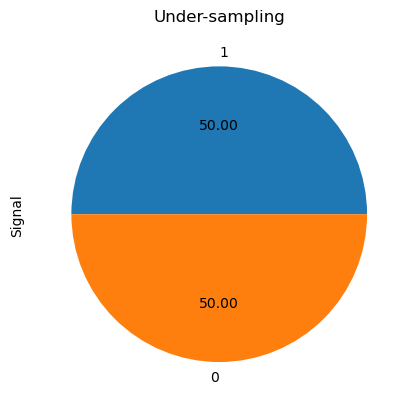

In [27]:
ax = y_resampled.value_counts().plot.pie(autopct='%.2f')
_ = ax.set_title("Under-sampling")

## Model #1: Support Vector Classifier (SVC) from sklearn library

In [28]:
# From SVM, instantiate SVC classifier model instance
svc_model = svm.SVC()
 
svc_model = svc_model.fit(X_resampled, y_resampled)
 
svc_pred = svc_model.predict(X_test_scaled)

display(svc_pred[:10])

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

### Evaluation metrics

In [29]:
svc_pred.shape

(33108,)

In [30]:
svc_testing_report = classification_report(y_test, svc_pred)
print(svc_testing_report)

              precision    recall  f1-score   support

           0       0.00      0.00      0.00     15749
           1       0.52      1.00      0.69     17359

    accuracy                           0.52     33108
   macro avg       0.26      0.50      0.34     33108
weighted avg       0.27      0.52      0.36     33108



/Users/kausarhina/opt/anaconda3/envs/freqtrade_test/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/kausarhina/opt/anaconda3/envs/freqtrade_test/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/kausarhina/opt/anaconda3/envs/freqtrade_test/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

In [31]:
# Calculate R_Square and Adjusted R Square
# The closer R2 and R2_adj are to 1 the better the model fit
R2 = r2_score(y_test, svc_pred)
#n is the sample size and p is the number of independent variables
R2_adj = 1-(1-R2)*((len(y_test))-1)/((len(y_test))-1-1)
print("The R squared is", R2)
print ("The R squared adjusted is", R2_adj)

The R squared is -0.9072527219309872
The R squared adjusted is -0.9073103324161538


In [32]:
# Calculate mean squared error and sqr rt of mean squared error
# The closer MSE & srMSE are to 0 the better the model fit
mse = (mean_squared_error(y_test, svc_pred))
sqr_mse = (math.sqrt(mean_squared_error(y_test, svc_pred)))
print(f"The mean square error is", mse)
print(f"The square root of the mse is", sqr_mse)

The mean square error is 0.47568563489186905
The square root of the mse is 0.6896996700679717


In [ ]:
X_test.info()
display(signals_df.info())

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 33108 entries, 2019-04-03 04:00:00 to 2023-01-12 00:00:00
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Close             33108 non-null  float64
 1   fast_MA           33108 non-null  float64
 2   slow_MA           33108 non-null  float64
 3   Entry/Exit        33108 non-null  float64
 4   Actual Returns    33108 non-null  float64
 5   Strategy Returns  33108 non-null  float64
dtypes: float64(6)
memory usage: 1.8 MB
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 35270 entries, 2019-01-03 02:00:00 to 2023-01-12 00:00:00
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Close             35270 non-null  float64
 1   fast_MA           35270 non-null  float64
 2   slow_MA           35270 non-null  float64
 3   Signal            35270 non-null  int64  
 4   Entry/Exit 

None

In [48]:
# Create a predictions DataFrame
predictions_df = pd.DataFrame()

# Add the SVM model predictions to the DataFrame
predictions_df['SVC Predicted'] = svc_pred

predictions_df['Actual Returns'] = signals_df.reset_index()['Actual Returns']

predictions_df['SVC Strategy Returns'] = predictions_df['Actual Returns'] * predictions_df['SVC Predicted']

# Review the DataFrame
display(predictions_df.head())
display(predictions_df.tail())

,SVC Predicted,Actual Returns,SVC Strategy Returns
0,1,-0.000969,-0.000969
1,1,0.001219,0.001219
2,1,-0.002609,-0.002609
3,1,-0.004559,-0.004559
4,1,-0.000025,-0.000025


,SVC Predicted,Actual Returns,SVC Strategy Returns
33103,1,0.013461,0.013461
33104,1,-0.002008,-0.002008
33105,1,0.000413,0.000413
33106,1,0.001341,0.001341
33107,1,0.001030,0.001030


In [49]:
(1 + predictions_df[['SVC Strategy Returns']]).cumprod().sum()

SVC Strategy Returns    196375.707439
dtype: float64

In [50]:
(1 + predictions_df[['Actual Returns']]).cumprod().sum()

Actual Returns    196375.707439
dtype: float64

<AxesSubplot: title={'center': 'SVC Strategy Returns vs. Actual Returns with Support Vecotr Classifier model'}>

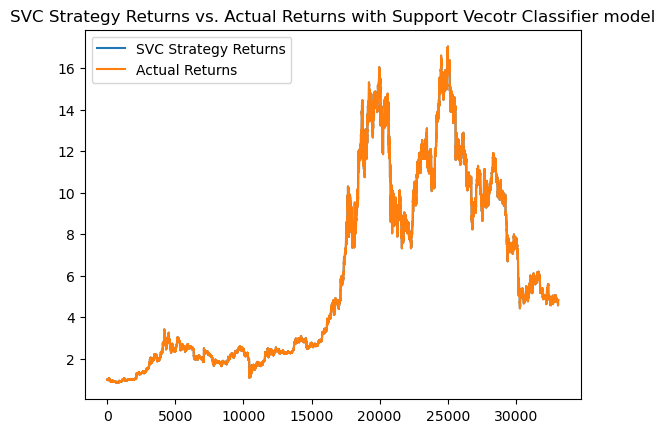

In [51]:
# Plot the actual returns versus the strategy returns
(1 + predictions_df[['SVC Strategy Returns','Actual Returns']]).cumprod().plot(title="SVC Strategy Returns vs. Actual Returns with Support Vecotr Classifier model")


In [ ]:
display(predictions_df.index)
signals_df.index

### Backtest the model 1: SVC to evaluate its performance.

In [53]:
# Initial Capital Investment
initial_capital = float(1000)

# Share size of each trade
share_size = 1

backtest_df = pd.DataFrame(index=predictions_df.index)
backtest_df['Close'] = signals_df.reset_index()['Close']

In [54]:
# Buy a 1 share position when the signal is 1
# Sell a 1 share position when the signal is 0
backtest_df['Position'] = share_size * predictions_df['SVC Predicted']
# Determine the points in time where a 500 share position is bought or sold
backtest_df['Entry/Exit Position'] = backtest_df['Position'].diff()
# Multiply the close price by the number of shares held, or the Position
backtest_df['Portfolio Holdings'] = backtest_df['Close'] * backtest_df['Position']
# Subtract the amount of either the cost or proceeds of the trade from the initial capital invested
backtest_df['Portfolio Cash'] = initial_capital - (backtest_df['Close'] * backtest_df['Entry/Exit Position']).cumsum()
# Calculate the total portfolio value by adding the portfolio cash to the portfolio holdings (or investments)
backtest_df['Portfolio Total'] = backtest_df['Portfolio Cash'] + backtest_df['Portfolio Holdings']
# Calculate the portfolio daily returns
backtest_df['Portfolio Daily Returns'] = backtest_df['Portfolio Total'].pct_change()
# Calculate the portfolio cumulative returns
backtest_df['Portfolio Cumulative Returns'] = (1 + backtest_df['Portfolio Daily Returns']).cumprod() - 1
backtest_df.tail(10)

,Close,Position,Entry/Exit Position,Portfolio Holdings,Portfolio Cash,Portfolio Total,Portfolio Daily Returns,Portfolio Cumulative Returns
33098,18429.0,1,0.0,18429.0,1000.0,19429.0,0.002166,2.866545
33099,18421.0,1,0.0,18421.0,1000.0,19421.0,-0.000412,2.864953
33100,18953.0,1,0.0,18953.0,1000.0,19953.0,0.027393,2.970825
33101,19093.0,1,0.0,19093.0,1000.0,20093.0,0.007016,2.998687
33102,19166.0,1,0.0,19166.0,1000.0,20166.0,0.003633,3.013214
33103,19424.0,1,0.0,19424.0,1000.0,20424.0,0.012794,3.064558
33104,19385.0,1,0.0,19385.0,1000.0,20385.0,-0.001910,3.056797
33105,19393.0,1,0.0,19393.0,1000.0,20393.0,0.000392,3.058389
33106,19419.0,1,0.0,19419.0,1000.0,20419.0,0.001275,3.063563
33107,19439.0,1,0.0,19439.0,1000.0,20439.0,0.000979,3.067544


In [55]:
backtest_df['Entry/Exit Position'].value_counts()

0.0    33107
Name: Entry/Exit Position, dtype: int64

In [56]:
# Visualize exit position relative to total portfolio value
exit = backtest_df[backtest_df['Entry/Exit Position'] == -1.0]['Portfolio Total'].hvplot.scatter(
    color='yellow',
    marker='v',
    legend=False,
    ylabel='Total Portfolio Value',
    width=1000,
    height=400
)

# Visualize entry position relative to total portfolio value
entry = backtest_df[backtest_df['Entry/Exit Position'] == 1.0]['Portfolio Total'].hvplot.scatter(
    color='purple',
    marker='^',
    ylabel='Total Portfolio Value',
    width=1000,
    height=400
)

# Visualize the value of the total portfolio
total_portfolio_value = backtest_df[['Portfolio Total']].hvplot(
    line_color='lightgray',
    ylabel='Total Portfolio Value',
    xlabel='Date',
    width=1000,
    height=400
)

# Overlay the plots
portfolio_entry_exit_plot = total_portfolio_value * entry * exit
portfolio_entry_exit_plot.opts(
    title="BTC Algorithm with SVC Preditions- Total Portfolio Value",
    yformatter='%.0f'
)

:Overlay
   .Curve.I                    :Curve   [index]   (Portfolio Total)
   .Scatter.Portfolio_Total.I  :Scatter   [index]   (Portfolio Total)
   .Scatter.Portfolio_Total.II :Scatter   [index]   (Portfolio Total)

## Model #2: Random Forest Classifier from sklearn library

In [57]:
# Initiate the model instance
RFC = RandomForestClassifier(max_depth=3, random_state=1)

# Fit the model using the training data
model = RFC.fit(X_resampled, y_resampled)

# Use the testing dataset to generate the predictions for the new model
forest_pred = RFC.predict(X_test)

# Review the model's predicted values
forest_pred[:10]

/Users/kausarhina/opt/anaconda3/envs/freqtrade_test/lib/python3.10/site-packages/sklearn/base.py:402: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

### Evaluation Metrics

In [58]:
# Use a classification report to evaluate the model using the predictions and testing data
forest_pred_report = classification_report(y_test, forest_pred)

# Print the classification report
print(forest_pred_report)


              precision    recall  f1-score   support

           0       0.00      0.00      0.00     15749
           1       0.52      1.00      0.69     17359

    accuracy                           0.52     33108
   macro avg       0.26      0.50      0.34     33108
weighted avg       0.27      0.52      0.36     33108



/Users/kausarhina/opt/anaconda3/envs/freqtrade_test/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/kausarhina/opt/anaconda3/envs/freqtrade_test/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/kausarhina/opt/anaconda3/envs/freqtrade_test/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

In [59]:
# Calculate R_Square and Adjusted R Square
# The closer R2 and R2_adj are to 1 the better the model fit
R2 = r2_score(y_test, forest_pred)
#n is the sample size and p is the number of independent variables
R2_adj = 1-(1-R2)*((len(y_test))-1)/((len(y_test))-1-1)
print("The R squared is", R2)
print ("The R squared adjusted is", R2_adj)

The R squared is -0.9072527219309872
The R squared adjusted is -0.9073103324161538


In [60]:
# Calculate mean squared error and sqr rt of mean squared error
# The closer MSE & srMSE are to 0 the better the model fit
mse = (mean_squared_error(y_test, forest_pred))
sqr_mse = (math.sqrt(mean_squared_error(y_test, forest_pred)))
print(f"The mean square error is", mse)
print(f"The square root of the mse is", sqr_mse)

The mean square error is 0.47568563489186905
The square root of the mse is 0.6896996700679717


In [62]:
# Add RVR model predictions to predicitons dataframe
predictions_df['RFC Predictions'] = forest_pred
predictions_df['Actual Returns'] = signals_df.reset_index()['Actual Returns']
predictions_df['RFC Strategy Returns'] = predictions_df['Actual Returns'] * predictions_df['RFC Predictions']

# Review the DataFrame
predictions_df

,SVC Predicted,Actual Returns,SVC Strategy Returns,RFC Predictions,RFC Strategy Returns
0,1,-0.000969,-0.000969,1,-0.000969
1,1,0.001219,0.001219,1,0.001219
2,1,-0.002609,-0.002609,1,-0.002609
3,1,-0.004559,-0.004559,1,-0.004559
4,1,-0.000025,-0.000025,1,-0.000025
...,...,...,...,...,...
33103,1,0.013461,0.013461,1,0.013461
33104,1,-0.002008,-0.002008,1,-0.002008
33105,1,0.000413,0.000413,1,0.000413
33106,1,0.001341,0.001341,1,0.001341


In [63]:
(1 + predictions_df[['RFC Strategy Returns']]).cumprod().sum()

RFC Strategy Returns    196375.707439
dtype: float64

In [64]:
(1 + predictions_df[['Actual Returns']]).cumprod().sum()

Actual Returns    196375.707439
dtype: float64

<AxesSubplot: title={'center': 'RFC Strategy Returns vs. Actual with Random Forest Classifier model'}>

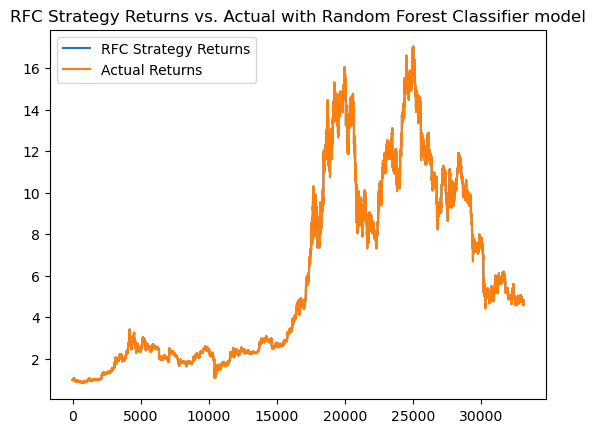

In [65]:
# Plot the actual returns versus the strategy returns
(1 + predictions_df[['RFC Strategy Returns','Actual Returns']]).cumprod().plot(title="RFC Strategy Returns vs. Actual with Random Forest Classifier model")

### Backtest the model 2: RVC to evaluate its performance. 

In [67]:
# Initial Capital Investment
initial_capital = float(1000)

# Share size of each trade
share_size = 1

backtest_df = pd.DataFrame(index=predictions_df.index)
backtest_df['Close'] = signals_df.reset_index()['Close']

In [68]:
# Buy a 1 share position when the signal is 1
# Sell a 1 share position when the signal is 0
backtest_df['Position'] = share_size * predictions_df['SVC Predicted']
# Determine the points in time where a 500 share position is bought or sold
backtest_df['Entry/Exit Position'] = backtest_df['Position'].diff()
# Multiply the close price by the number of shares held, or the Position
backtest_df['Portfolio Holdings'] = backtest_df['Close'] * backtest_df['Position']
# Subtract the amount of either the cost or proceeds of the trade from the initial capital invested
backtest_df['Portfolio Cash'] = initial_capital - (backtest_df['Close'] * backtest_df['Entry/Exit Position']).cumsum()
# Calculate the total portfolio value by adding the portfolio cash to the portfolio holdings (or investments)
backtest_df['Portfolio Total'] = backtest_df['Portfolio Cash'] + backtest_df['Portfolio Holdings']
# Calculate the portfolio daily returns
backtest_df['Portfolio Daily Returns'] = backtest_df['Portfolio Total'].pct_change()
# Calculate the portfolio cumulative returns
backtest_df['Portfolio Cumulative Returns'] = (1 + backtest_df['Portfolio Daily Returns']).cumprod() - 1
backtest_df.tail(10)

,Close,Position,Entry/Exit Position,Portfolio Holdings,Portfolio Cash,Portfolio Total,Portfolio Daily Returns,Portfolio Cumulative Returns
33098,18429.0,1,0.0,18429.0,1000.0,19429.0,0.002166,2.866545
33099,18421.0,1,0.0,18421.0,1000.0,19421.0,-0.000412,2.864953
33100,18953.0,1,0.0,18953.0,1000.0,19953.0,0.027393,2.970825
33101,19093.0,1,0.0,19093.0,1000.0,20093.0,0.007016,2.998687
33102,19166.0,1,0.0,19166.0,1000.0,20166.0,0.003633,3.013214
33103,19424.0,1,0.0,19424.0,1000.0,20424.0,0.012794,3.064558
33104,19385.0,1,0.0,19385.0,1000.0,20385.0,-0.001910,3.056797
33105,19393.0,1,0.0,19393.0,1000.0,20393.0,0.000392,3.058389
33106,19419.0,1,0.0,19419.0,1000.0,20419.0,0.001275,3.063563
33107,19439.0,1,0.0,19439.0,1000.0,20439.0,0.000979,3.067544


In [69]:
backtest_df['Entry/Exit Position'].value_counts()

0.0    33107
Name: Entry/Exit Position, dtype: int64

In [70]:
# Visualize exit position relative to total portfolio value
exit = backtest_df[backtest_df['Entry/Exit Position'] == -1.0]['Portfolio Total'].hvplot.scatter(
    color='yellow',
    marker='v',
    legend=False,
    ylabel='Total Portfolio Value',
    width=1000,
    height=400
)

# Visualize entry position relative to total portfolio value
entry = backtest_df[backtest_df['Entry/Exit Position'] == 1.0]['Portfolio Total'].hvplot.scatter(
    color='purple',
    marker='^',
    ylabel='Total Portfolio Value',
    width=1000,
    height=400
)

# Visualize the value of the total portfolio
total_portfolio_value = backtest_df[['Portfolio Total']].hvplot(
    line_color='lightgray',
    ylabel='Total Portfolio Value',
    xlabel='Date',
    width=1000,
    height=400
)

# Overlay the plots
portfolio_entry_exit_plot = total_portfolio_value * entry * exit
portfolio_entry_exit_plot.opts(
    title="BTC Algorithm with SVC Preditions- Total Portfolio Value",
    yformatter='%.0f'
)

:Overlay
   .Curve.I                    :Curve   [index]   (Portfolio Total)
   .Scatter.Portfolio_Total.I  :Scatter   [index]   (Portfolio Total)
   .Scatter.Portfolio_Total.II :Scatter   [index]   (Portfolio Total)

## Model #3: KNearest Neighbors Classifier (kNN) from sklearn library

In [71]:
kNN = KNeighborsClassifier(n_neighbors = 3)
kNN = kNN.fit(X_train_scaled, y_train)
kNN_pred = kNN.predict(X_test_scaled)


### Evaluation Metrics

In [72]:
# Use a classification report to evaluate the model using the predictions and testing data
kNN_pred_report = classification_report(y_test, kNN_pred)

# Print the classification report
print(kNN_pred_report)


              precision    recall  f1-score   support

           0       0.86      0.00      0.00     15749
           1       0.52      1.00      0.69     17359

    accuracy                           0.52     33108
   macro avg       0.69      0.50      0.34     33108
weighted avg       0.68      0.52      0.36     33108



In [73]:
# Calculate R_Square and Adjusted R Square
# The closer R2 and R2_adj are to 1 the better the model fit
R2 = r2_score(y_test, kNN_pred)
#n is the sample size and p is the number of independent variables
R2_adj = 1-(1-R2)*((len(y_test))-1)/((len(y_test))-1-1)
print("The R squared is", R2)
print ("The R squared adjusted is", R2_adj)

The R squared is -0.9066472064309772
The R squared adjusted is -0.9067047986259398


In [74]:
# Calculate mean squared error and sqr rt of mean squared error
# The closer MSE & srMSE are to 0 the better the model fit
mse = (mean_squared_error(y_test, kNN_pred))
sqr_mse = (math.sqrt(mean_squared_error(y_test, kNN_pred)))
print(f"The mean square error is", mse)
print(f"The square root of the mse is", sqr_mse)

The mean square error is 0.4755346139905763
The square root of the mse is 0.6895901782874929


In [76]:

# Add the kNN model predictions to the DataFrame
predictions_df['kNN Predictions'] = kNN_pred
predictions_df['Actual Returns'] = signals_df.reset_index()['Actual Returns']
# Add the strategy returns to the DataFrame
predictions_df['kNN Strategy Returns'] = predictions_df['Actual Returns'] * predictions_df['kNN Predictions']


<AxesSubplot: title={'center': 'kNN Strategy Returns vs. Actual with kNearest Neighbor Classifier model'}>

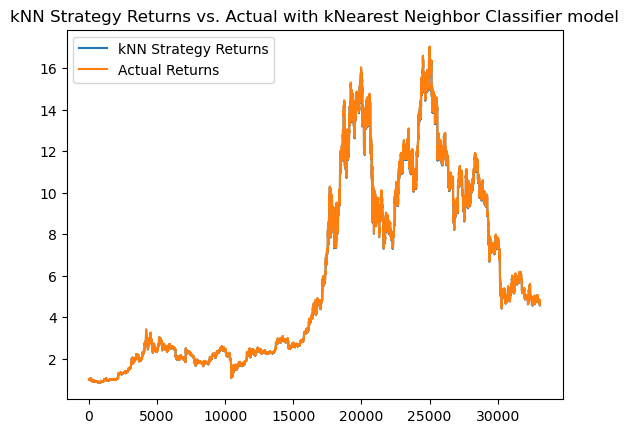

In [77]:
# Plot the actual returns versus the strategy returns
(1 + predictions_df[['kNN Strategy Returns','Actual Returns']]).cumprod().plot(title="kNN Strategy Returns vs. Actual with kNearest Neighbor Classifier model")

### Backtest the model 3: kNN to evaluate its performance. 

In [79]:
# Initial Capital Investment
initial_capital = float(1000)

# Share size of each trade
share_size = 1

backtest_df = pd.DataFrame(index=predictions_df.index)
backtest_df['Close'] = signals_df.reset_index()['Close']

In [80]:
# Buy a 1 share position when the signal is 1
# Sell a 1 share position when the signal is 0
backtest_df['Position'] = share_size * predictions_df['SVC Predicted']
# Determine the points in time where a 500 share position is bought or sold
backtest_df['Entry/Exit Position'] = backtest_df['Position'].diff()
# Multiply the close price by the number of shares held, or the Position
backtest_df['Portfolio Holdings'] = backtest_df['Close'] * backtest_df['Position']
# Subtract the amount of either the cost or proceeds of the trade from the initial capital invested
backtest_df['Portfolio Cash'] = initial_capital - (backtest_df['Close'] * backtest_df['Entry/Exit Position']).cumsum()
# Calculate the total portfolio value by adding the portfolio cash to the portfolio holdings (or investments)
backtest_df['Portfolio Total'] = backtest_df['Portfolio Cash'] + backtest_df['Portfolio Holdings']
# Calculate the portfolio daily returns
backtest_df['Portfolio Daily Returns'] = backtest_df['Portfolio Total'].pct_change()
# Calculate the portfolio cumulative returns
backtest_df['Portfolio Cumulative Returns'] = (1 + backtest_df['Portfolio Daily Returns']).cumprod() - 1
backtest_df.tail(10)

,Close,Position,Entry/Exit Position,Portfolio Holdings,Portfolio Cash,Portfolio Total,Portfolio Daily Returns,Portfolio Cumulative Returns
33098,18429.0,1,0.0,18429.0,1000.0,19429.0,0.002166,2.866545
33099,18421.0,1,0.0,18421.0,1000.0,19421.0,-0.000412,2.864953
33100,18953.0,1,0.0,18953.0,1000.0,19953.0,0.027393,2.970825
33101,19093.0,1,0.0,19093.0,1000.0,20093.0,0.007016,2.998687
33102,19166.0,1,0.0,19166.0,1000.0,20166.0,0.003633,3.013214
33103,19424.0,1,0.0,19424.0,1000.0,20424.0,0.012794,3.064558
33104,19385.0,1,0.0,19385.0,1000.0,20385.0,-0.001910,3.056797
33105,19393.0,1,0.0,19393.0,1000.0,20393.0,0.000392,3.058389
33106,19419.0,1,0.0,19419.0,1000.0,20419.0,0.001275,3.063563
33107,19439.0,1,0.0,19439.0,1000.0,20439.0,0.000979,3.067544


In [81]:
# Visualize exit position relative to total portfolio value
exit = backtest_df[backtest_df['Entry/Exit Position'] == -1.0]['Portfolio Total'].hvplot.scatter(
    color='yellow',
    marker='v',
    legend=False,
    ylabel='Total Portfolio Value',
    width=1000,
    height=400
)

# Visualize entry position relative to total portfolio value
entry = backtest_df[backtest_df['Entry/Exit Position'] == 1.0]['Portfolio Total'].hvplot.scatter(
    color='purple',
    marker='^',
    ylabel='Total Portfolio Value',
    width=1000,
    height=400
)

# Visualize the value of the total portfolio
total_portfolio_value = backtest_df[['Portfolio Total']].hvplot(
    line_color='lightgray',
    ylabel='Total Portfolio Value',
    xlabel='Date',
    width=1000,
    height=400
)

# Overlay the plots
portfolio_entry_exit_plot = total_portfolio_value * entry * exit
portfolio_entry_exit_plot.opts(
    title="BTC Algorithm with SVC Preditions- Total Portfolio Value",
    yformatter='%.0f'
)

:Overlay
   .Curve.I                    :Curve   [index]   (Portfolio Total)
   .Scatter.Portfolio_Total.I  :Scatter   [index]   (Portfolio Total)
   .Scatter.Portfolio_Total.II :Scatter   [index]   (Portfolio Total)